## Caviglia Sara - 5163676
# Midterm: Change detection using a unsupervised image segmentation algorithm

<i>Objective</i>

In this assignment you will use a unsupervised image segmentation algorithm to perform change detection (in the hypothesis the camera is still) between adjacent frames of a sequence.

<i>Sketch of methodology</i>

In particular, you will first use the SLIC algorithm to segment image frames  and then classify a superpixel deciding whether it has changed or not from t to t+1, by comparing superpixels in a "similar position" at time t and t+1. More specifically, given frames t and t+1 you should associate the superpixels at time t to those at time t+1, this should be done by designing a matching procedure between superpixels, inspired by the ones you saw in the previuos lessons and by the fact the two frames should be similar enough. Note that there isn't necessarily a superpixel at time t+1 to be associated to the previous frame (as there are new elements in the image). Deal with this problem only if you have time.

<i>More details</i>

You should identify a selection of appropriate data to present your results. Provide visualization of images, superpixels and a mask of the detected changes at the superpixel level. Use the code provided in the previous labs and implement new functions when needed. Add comments on your choices, for example on the feature(s) used for the matching procedure and the criterion used to detect the change. Analyze the effect of choosing different number of superpixels. The results don't need to be perfect, but any flaw or limit should be commented.

### Dataset source: [Kaggle - Change Detection 2014](https://www.kaggle.com/datasets/maamri95/cdnet2014)

In the dataset used I have frames from a still camera in a break room. During the video, from which these frames were extracted, we can see the empty room, until a man comes in, takes a book from a shelf, consults it, puts it back and leaves. After some tests with the first two frames, where nothing happens, I have focused my attention on the frames where the man enters the room and the ones where he picks us the book.

Since I had only the frames, I reconstructed the video using OpenCV: it is now visible at the [link](https://unigeit-my.sharepoint.com/:v:/g/personal/s5163676_studenti_unige_it/ERwlemgSdTRFhkYjbE1NrNMBMZ80Q0TOXRXd4fRGr9jJKg?nav=eyJyZWZlcnJhbEluZm8iOnsicmVmZXJyYWxBcHAiOiJPbmVEcml2ZUZvckJ1c2luZXNzIiwicmVmZXJyYWxBcHBQbGF0Zm9ybSI6IldlYiIsInJlZmVycmFsTW9kZSI6InZpZXciLCJyZWZlcnJhbFZpZXciOiJNeUZpbGVzTGlua0NvcHkifX0&e=AjgoTJ).

```python
import cv2
from skimage import io

indices = []
for i in range(1, 10):
    indices.append(f'00000{i}')
for i in range(10, 100):
    indices.append(f'0000{i}')
for i in range(100, 1000):
    indices.append(f'000{i}')
for i in range(1000, 2051):
    indices.append(f'00{i}')

images = []
for i in indices:
    img = io.imread(f'images/in{i}.jpg')
    images.append(img)

height, width, layers = images[0].shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output_video.mp4', fourcc, 20.0, (width, height))

for frame in images:
    out.write(frame)

out.release()
print('Video saved!')

### Imports and implemeted functions

In [1]:
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from scipy import spatial
from skimage import io
from skimage.segmentation import slic, mark_boundaries
import cv2 as cv2

In [2]:
def superpixels_patches(superpixels):
    """
    This function creates a list of patches from the superpixels; it also computes the centroid of each superpixel, which is used as feature.
    """
    # First get unique superpixel values
    unique_values = np.unique(superpixels)
    
    # Initialize patches as a list of empty lists, one for each superpixel value
    patches = [[] for _ in range(len(unique_values))]
    centroids = []

    for i in range(superpixels.shape[0]):
        for j in range(superpixels.shape[1]):
            pixel_value = superpixels[i, j]
            # Find the index of this value in our unique values list
            k = np.where(unique_values == pixel_value)[0][0]
            patches[k].append([i, j])

    for i in range(len(patches)):
        if len(patches[i]) > 0:
            # Calculate the centroid of the patch
            centroid = np.mean(patches[i], axis=0)
            centroids.append(centroid)
        else:
            centroids.append([0, 0])

    patches = [np.array(patch) for patch in patches]
    centroids = np.array(centroids)
    centroids = np.round(centroids).astype(int)
    
    return patches, centroids

In [3]:
def patch_descriptor(I, centroids, size_w):
    """
    This function is reused from a previous lab: it extracts descriptors of square patches around each centroid.
    """
	# Extract square patches around each corner on an input grayscale image.
	# I: input image
	# corner_pos: np.array containing the (row, column) coordinates of the corners
	# size_w: (integer) patch side

    n = len(centroids) # Number of features
    hw = int(np.floor(size_w/2)) # half size of the patch (useful to center the pat)
    I_ext = np.pad(I, hw, 'reflect') # pad the image with a frame of width hw

    # initialize patches list
    patches = np.zeros([n,(2*hw+1)**2])

    for i in range(0, n):

        r = centroids[i, 0]+hw # adjust the row of each corner considering the padding
        c = centroids[i, 1]+hw # do the same for the column
        tmp = I_ext[r-hw:r+hw+1, c-hw:c+hw+1] # estract the patch
        patches[i,:] = tmp.flatten() #flatten the patch and save it in the patches list

    return patches

In [4]:
def spectral_matching(superpixels1, superpixels2, centroids1, centroids2, sigma, alpha):
	"""
	This function is reused from a previous lab: instead of the patches we have the superpixels, and instead of the corner's positions we have the position of the centroids.
	"""
	# superpixels1, superpixels2: These are np.arrays holding the image patches around detected corners in the first and second images. They describe the visual appearance of the features.
	# centroids1, centroids2: np.arrays containing the (row, column) coordinates of the corners in the first and second images.
	# sigma: A parameter that controls the sensitivity of the matching process (used within a Gaussian function for weighting distances).
	# alpha: A weighting factor to balance the importance of position and appearance in the matching process.

	# evaluate the distance between patches
	D = spatial.distance.cdist(superpixels1, superpixels2, metric='euclidean')
	# evaluate the distance between corners
	D_pos = spatial.distance.cdist(centroids1,centroids2, metric='euclidean')
	# compute the affinity matrix using the exponent formulation
	E1 = np.exp(-D_pos//(2*sigma*sigma)) #position
	E2 = np.exp(-D//(2*sigma*sigma)) #patches
	# by appropriate choices of alpha you may give more or less importance to the two components
	E = 0.5*(alpha*E1+(1-alpha)*E2)

	argmaxE_h = np.argmax(E, axis=1)
	argmaxE_v = np.argmax(E, axis=0)
	match = np.zeros((len(centroids1), 2), dtype=int)
	for i, amx in enumerate(argmaxE_h):
		if argmaxE_v[amx] == i:
			match[i] = centroids2[amx]

	return E, match

In [5]:
def show_match(match, centroids1, centroids2, img1, img2):
    """
    This function is reused from a previous lab: it shows match on side-by-side images.
    """

    img= np.concatenate([img1,img2],axis=1)
    plt.imshow(img, cmap=cm.gist_gray)

    for i in range(0, len(centroids1)):
        plt.plot([centroids1[i,1], match[i,1]+img1.shape[1]], [centroids1[i,0], match[i,0]],'y')

    plt.scatter(centroids1[:,1], centroids1[:,0], s=10, c='r')
    plt.scatter(centroids2[:,1]+img1.shape[1], centroids2[:,0], s=20, c='b')

    return img

In [6]:
def difference(superpixels1, superpixels2):
    """
    This function computes the absolute difference between the segmentation of two images pixel-wise.
    """
    # Initialize the difference array with zeros
    d = np.zeros(superpixels1.shape, dtype=np.int32)

    # Iterate through each pixel in the superpixels arrays
    for i in range(superpixels1.shape[0]):
        for j in range(superpixels1.shape[1]):
            # Compute the absolute difference between the corresponding superpixel values
            d[i, j] = np.abs(superpixels1[i, j] - superpixels2[i, j])
    return d

In [7]:
def difference_patches(slic1, slic2, patches1, patches2, t):
    """
    This function computes the absolute difference between the segmentation of two images based on patches. 
    It compares the average values of the patches and marks them as different if the difference exceeds a threshold.
    """
    # Initialize the arrays with zeros
    diff = np.zeros(max(len(patches1), len(patches2)), dtype=np.float32)
    avg1 = np.zeros(len(patches1), dtype=np.float32)
    avg2 = np.zeros(len(patches2), dtype=np.float32)
    # Find the minimum length of the two patches: this is the number of patches that are common to both images
    min_len = min(len(patches1), len(patches2))

    # Compute averages
    for i in range(len(patches1)):
        avg1[i] = np.mean(patches1[i])
    for i in range(len(patches2)):
        avg2[i] = np.mean(patches2[i])

    # Compare patches where both exist
    for i in range(min_len):
        if np.abs(avg1[i] - avg2[i]) > t:
            diff[i] = 0
        else:
            diff[i] = 1

    # Handle extra patches: if the patch is not in the other image, we set the diff to 0.5
    if len(patches1) > min_len:
        for i in range(min_len, len(patches1)):
            diff[i] = 0.5

    if len(patches2) > min_len:
        for i in range(min_len, len(patches2)):
            diff[i] = 0.5

    # Build the diff_map
    diff_map = np.zeros(slic1.shape, dtype=np.float32)
    for i in range(len(diff)):
        diff_map[slic1 == i] = diff[i]

    return diff_map


### Import of the images and first analysis
We start by importing the two first frames in the dataset: since there is no movement, we expect to have no changes. I segmented and computed the difference between the two segmentations.

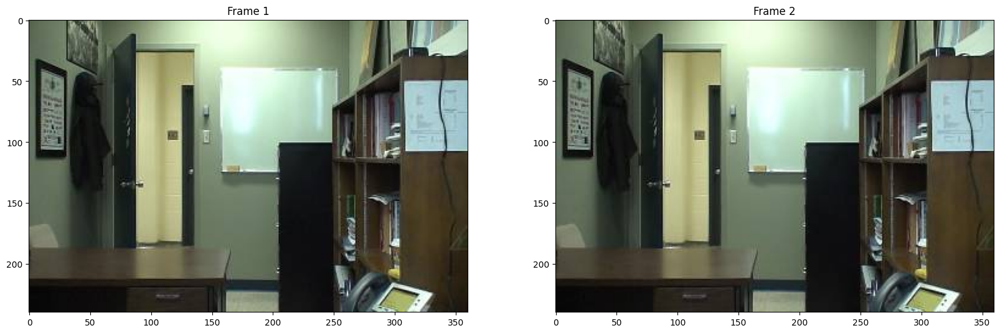

In [8]:
img1 = io.imread('images/in000001.jpg')
img2 = io.imread('images/in000002.jpg')
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.imshow(img1)
plt.title('Frame 1')
plt.subplot(122)
plt.imshow(img2)
plt.title('Frame 2')
plt.show()

Text(0.5, 1.0, 'Superpixels of img2')

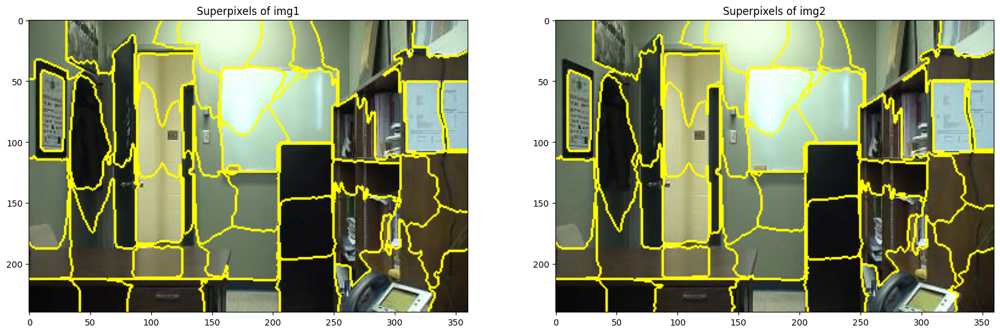

In [9]:
n_segments = 50
compactness = 10
sigma = 1

plt.figure(figsize=(20, 10))
slic_1 = slic(img1, n_segments=n_segments, compactness=compactness, sigma=sigma)
plt.subplot(121)
plt.imshow(mark_boundaries(img1, slic_1))
plt.title('Superpixels of img1')
plt.subplot(122)
slic_2 = slic(img2, n_segments=n_segments, compactness=compactness, sigma=sigma)
plt.imshow(mark_boundaries(img2, slic_2))
plt.title('Superpixels of img2')

Text(0.5, 1.0, 'Difference between segmentations of img1 and img2')

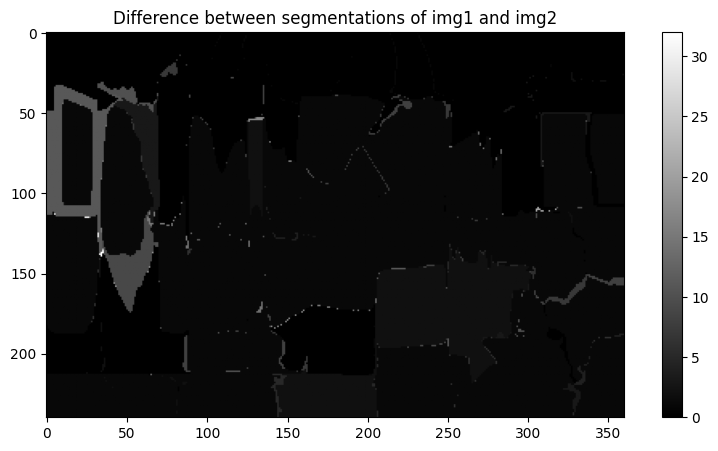

In [10]:
d_1_2 = difference(slic_1, slic_2)
plt.figure(figsize=(10, 5))
plt.imshow(d_1_2, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img1 and img2')

Since there are some parts with a higher difference, I tried to match the images to better understand this behaviour.

In [11]:
patches_1, centroids_1 = superpixels_patches(slic_1)
patches_2, centroids_2 = superpixels_patches(slic_2)

patches_1 = patch_descriptor(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY), centroids_1, 5)
patches_2 = patch_descriptor(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY), centroids_2, 5)

E, match = spectral_matching(patches_1, patches_2, centroids_1, centroids_2, 1, 0.5)

Text(0.5, 1.0, 'Matches between the centroids of the superpixels of img1 and img2')

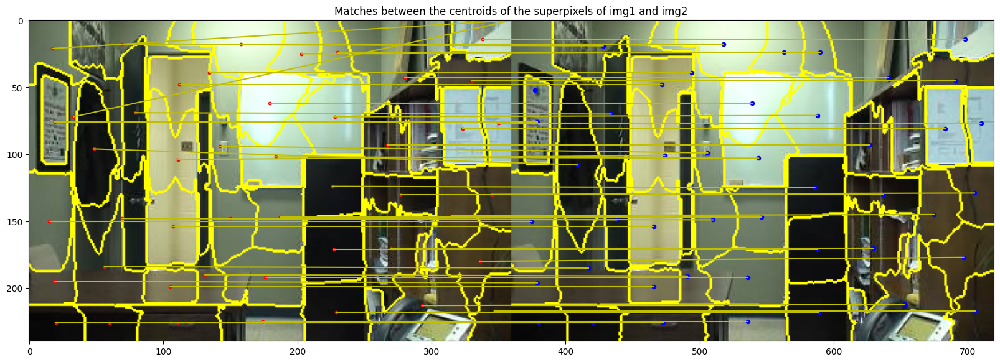

In [12]:
plt.figure(figsize=(20, 10))
match_1_2 = show_match(match, centroids_1, centroids_2, mark_boundaries(img1, slic_1), mark_boundaries(img2, slic_2))
plt.title('Matches between the centroids of the superpixels of img1 and img2')

As we can see, there are two centroids on first that are not matched with centroids on the second frame. This happens because the segmentation can produce a different number of superpixels even with very similar images. The centroids not matched are also the ones in the region where the difference bewteen segmentation was higher.

I then tried with a much later frame, the first where we have the entrance of the man.

Text(0.5, 1.0, 'Frame 583')

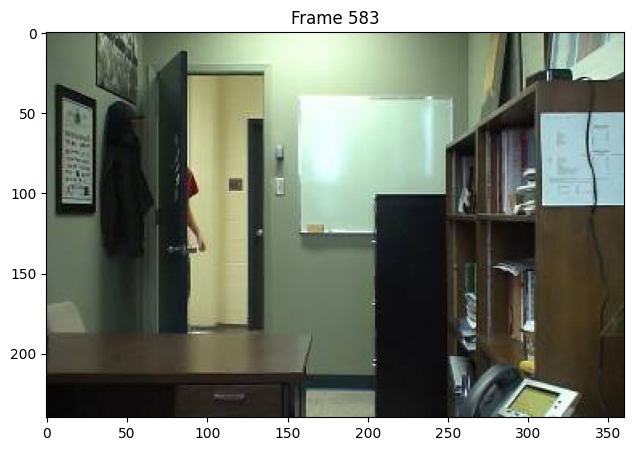

In [13]:
img583 = io.imread('images/in000583.jpg')
plt.figure(figsize=(10, 5))
plt.imshow(img583)
plt.title('Frame 583')

I then proceeded with the segmentation of the frame and with its match with the first frame, like using a background.

Text(0.5, 1.0, 'Superpixels of img583')

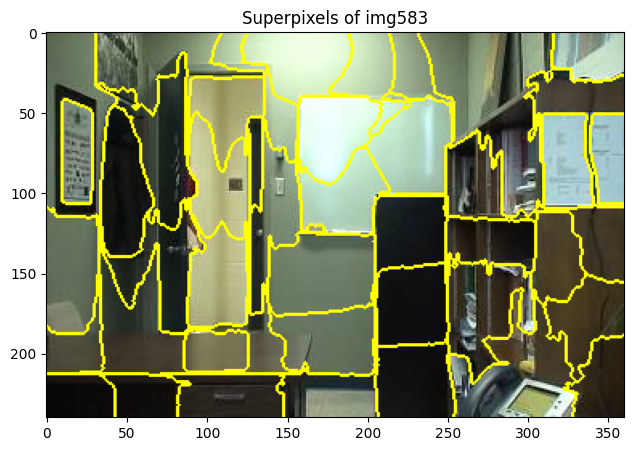

In [14]:
slic_583 = slic(img583, n_segments=n_segments, compactness=compactness, sigma=sigma)
plt.figure(figsize=(10,5))
plt.imshow(mark_boundaries(img583, slic_583))
plt.title('Superpixels of img583')

Text(0.5, 1.0, 'Matches between the centroids of the superpixels of img1 and img583')

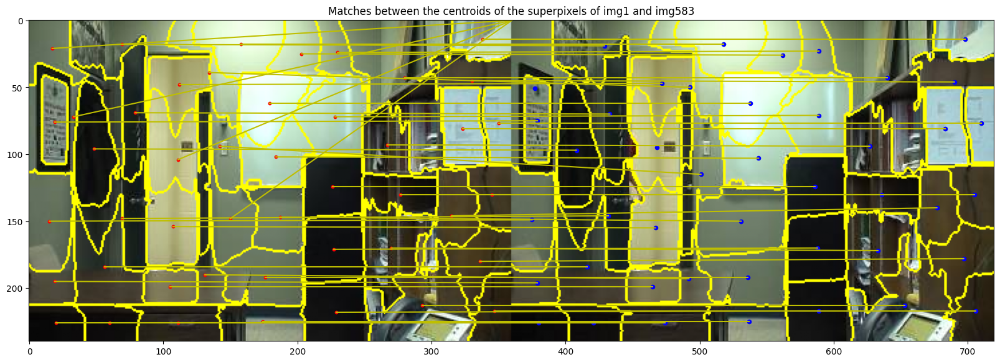

In [15]:
patches_583, centroids_583 = superpixels_patches(slic_583)
patches_583 = patch_descriptor(cv2.cvtColor(img583, cv2.COLOR_BGR2GRAY), centroids_583, 5)
E, match_583 = spectral_matching(patches_1, patches_583, centroids_1, centroids_583, 1, 0.5)
plt.figure(figsize=(20, 10))
match_1_583 = show_match(match_583, centroids_1, centroids_583, mark_boundaries(img1, slic_1), mark_boundaries(img583, slic_583))
plt.title('Matches between the centroids of the superpixels of img1 and img583')

Even in this case we can see that some centroids are not matched. What about the difference between the segmentations?

Text(0.5, 1.0, 'Difference between segmentations of img1 and img583')

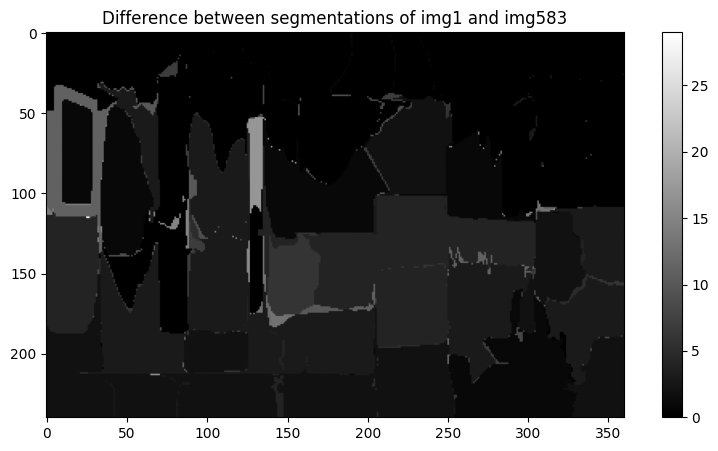

In [16]:
d_1_583 = difference(slic_1, slic_583)
plt.figure(figsize=(10, 5))
plt.imshow(d_1_583, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img1 and img583')

Here we don't have a region that stands out as before: we have to consider the much higher distance between the frames.

### Frames with movement
We can now consider a group of subsequent frames with some visible movement: the man enters the room.

Text(0.5, 1.0, 'Frame 593')

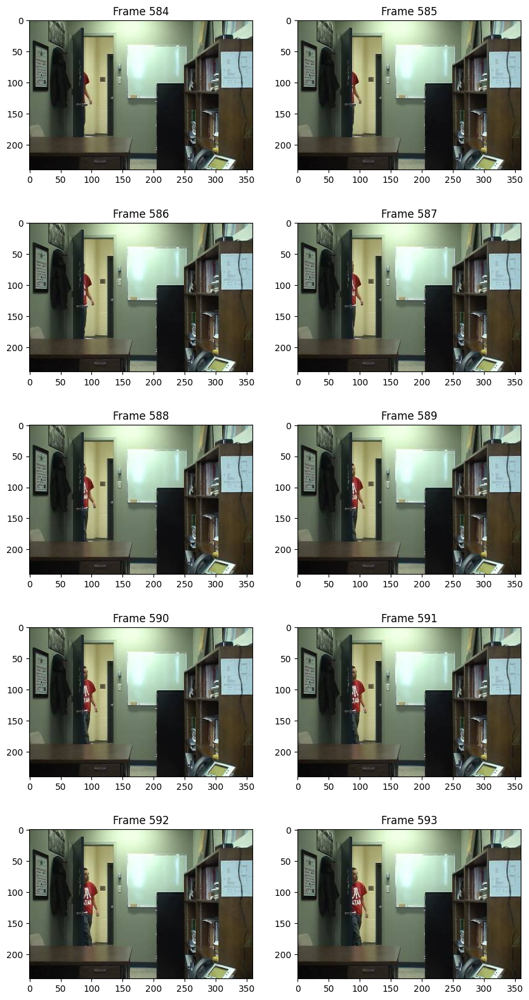

In [17]:
img584 = io.imread('images/in000584.jpg')
img585 = io.imread('images/in000585.jpg')
img586 = io.imread('images/in000586.jpg')
img587 = io.imread('images/in000587.jpg')
img588 = io.imread('images/in000588.jpg')
img589 = io.imread('images/in000589.jpg')
img590 = io.imread('images/in000590.jpg')
img591 = io.imread('images/in000591.jpg')
img592 = io.imread('images/in000592.jpg')
img593 = io.imread('images/in000593.jpg')

plt.figure(figsize=(10, 20))
plt.subplot(5, 2, 1)
plt.imshow(img584)
plt.title('Frame 584')
plt.subplot(5, 2, 2)
plt.imshow(img585)
plt.title('Frame 585')
plt.subplot(5, 2, 3)
plt.imshow(img586)
plt.title('Frame 586')
plt.subplot(5, 2, 4)
plt.imshow(img587)
plt.title('Frame 587')
plt.subplot(5, 2, 5)
plt.imshow(img588)
plt.title('Frame 588')
plt.subplot(5, 2, 6)
plt.imshow(img589)
plt.title('Frame 589')
plt.subplot(5, 2, 7)
plt.imshow(img590)
plt.title('Frame 590')
plt.subplot(5, 2, 8)
plt.imshow(img591)
plt.title('Frame 591')
plt.subplot(5, 2, 9)
plt.imshow(img592)
plt.title('Frame 592')
plt.subplot(5, 2, 10)
plt.imshow(img593)
plt.title('Frame 593')

I computed the segmentation and the difference between the frame 584 and all the others.

In [18]:
slic_584 = slic(img584, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_585 = slic(img585, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_586 = slic(img586, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_587 = slic(img587, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_588 = slic(img588, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_589 = slic(img589, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_590 = slic(img590, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_591 = slic(img591, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_592 = slic(img592, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_593 = slic(img593, n_segments=n_segments, compactness=compactness, sigma=sigma)

d_584_585 = difference(slic_584, slic_585)
d_584_586 = difference(slic_584, slic_586)
d_584_587 = difference(slic_584, slic_587)
d_584_588 = difference(slic_584, slic_588)
d_584_589 = difference(slic_584, slic_589)
d_584_590 = difference(slic_584, slic_590)
d_584_591 = difference(slic_584, slic_591)
d_584_592 = difference(slic_584, slic_592)
d_584_593 = difference(slic_584, slic_593)

Text(0.5, 1.0, 'Difference between segmentations of img584 and img593')

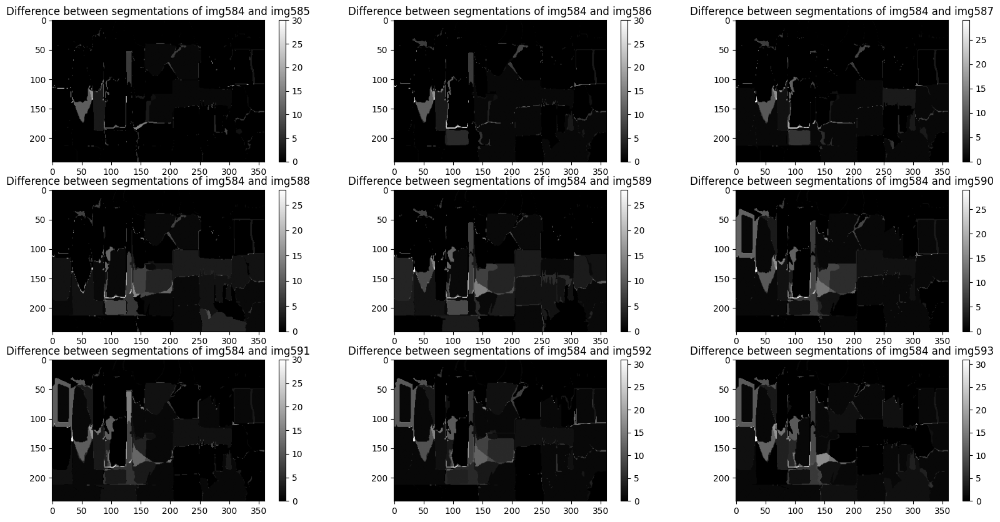

In [19]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_584_585, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img585')
plt.subplot(3, 3, 2)
plt.imshow(d_584_586, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img586')
plt.subplot(3, 3, 3)
plt.imshow(d_584_587, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img587')
plt.subplot(3, 3, 4)
plt.imshow(d_584_588, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img588')
plt.subplot(3, 3, 5)
plt.imshow(d_584_589, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img589')
plt.subplot(3, 3, 6)
plt.imshow(d_584_590, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img590')
plt.subplot(3, 3, 7)
plt.imshow(d_584_591, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img591')
plt.subplot(3, 3, 8)
plt.imshow(d_584_592, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img592')
plt.subplot(3, 3, 9)
plt.imshow(d_584_593, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img593')

We can see some movement around the door, probably also a change in the illumination, but there is no clear image. What happens if we try to compute the difference between subsequent frames?

In [20]:
d_585_586 = difference(slic_585, slic_586)
d_586_587 = difference(slic_586, slic_587)
d_587_588 = difference(slic_587, slic_588)
d_588_589 = difference(slic_588, slic_589)
d_589_590 = difference(slic_589, slic_590)
d_590_591 = difference(slic_590, slic_591)
d_591_592 = difference(slic_591, slic_592)
d_592_593 = difference(slic_592, slic_593)

Text(0.5, 1.0, 'Difference between segmentations of img592 and img593')

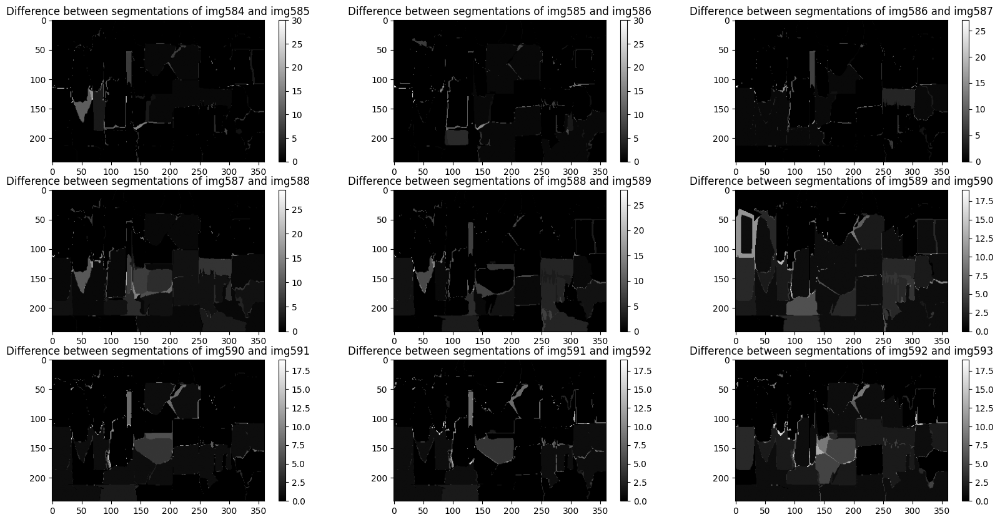

In [21]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_584_585, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img584 and img585')
plt.subplot(3, 3, 2)
plt.imshow(d_585_586, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img585 and img586')
plt.subplot(3, 3, 3)
plt.imshow(d_586_587, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img586 and img587')
plt.subplot(3, 3, 4)
plt.imshow(d_587_588, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img587 and img588')
plt.subplot(3, 3, 5)
plt.imshow(d_588_589, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img588 and img589')
plt.subplot(3, 3, 6)
plt.imshow(d_589_590, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img589 and img590')
plt.subplot(3, 3, 7)
plt.imshow(d_590_591, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img590 and img591')
plt.subplot(3, 3, 8)
plt.imshow(d_591_592, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img591 and img592')
plt.subplot(3, 3, 9)
plt.imshow(d_592_593, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img592 and img593')

Even in this case, we can't see clearly. We can try with another sequence of frames later on, which represents the man as he reaches for the book on the shelf.

Text(0.5, 1.0, 'Frame 682')

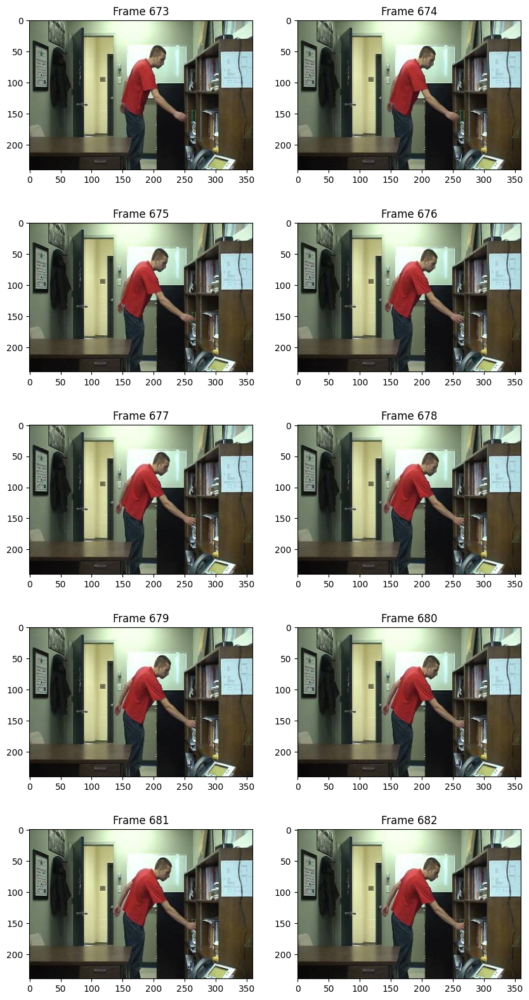

In [22]:
img_673 = io.imread('images/in000673.jpg')
img_674 = io.imread('images/in000674.jpg')
img_675 = io.imread('images/in000675.jpg')
img_676 = io.imread('images/in000676.jpg')
img_677 = io.imread('images/in000677.jpg')
img_678 = io.imread('images/in000678.jpg')
img_679 = io.imread('images/in000679.jpg')
img_680 = io.imread('images/in000680.jpg')
img_681 = io.imread('images/in000681.jpg')
img_682 = io.imread('images/in000682.jpg')

plt.figure(figsize=(10, 20))
plt.subplot(5, 2, 1)
plt.imshow(img_673)
plt.title('Frame 673')
plt.subplot(5, 2, 2)
plt.imshow(img_674)
plt.title('Frame 674')
plt.subplot(5, 2, 3)
plt.imshow(img_675)
plt.title('Frame 675')
plt.subplot(5, 2, 4)
plt.imshow(img_676)
plt.title('Frame 676')
plt.subplot(5, 2, 5)
plt.imshow(img_677)
plt.title('Frame 677')
plt.subplot(5, 2, 6)
plt.imshow(img_678)
plt.title('Frame 678')
plt.subplot(5, 2, 7)
plt.imshow(img_679)
plt.title('Frame 679')
plt.subplot(5, 2, 8)
plt.imshow(img_680)
plt.title('Frame 680')
plt.subplot(5, 2, 9)
plt.imshow(img_681)
plt.title('Frame 681')
plt.subplot(5, 2, 10)
plt.imshow(img_682)
plt.title('Frame 682')

We can now try and compute the superpixels segmentation and the relatives differences.

In [23]:
slic_673 = slic(img_673, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_674 = slic(img_674, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_675 = slic(img_675, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_676 = slic(img_676, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_677 = slic(img_677, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_678 = slic(img_678, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_679 = slic(img_679, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_680 = slic(img_680, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_681 = slic(img_681, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_682 = slic(img_682, n_segments=n_segments, compactness=compactness, sigma=sigma)

# Differences between the frame 673 and all the others
d_673_674 = difference(slic_673, slic_674)
d_673_675 = difference(slic_673, slic_675)
d_673_676 = difference(slic_673, slic_676)
d_673_677 = difference(slic_673, slic_677)
d_673_678 = difference(slic_673, slic_678)
d_673_679 = difference(slic_673, slic_679)
d_673_680 = difference(slic_673, slic_680)
d_673_681 = difference(slic_673, slic_681)
d_673_682 = difference(slic_673, slic_682)

# Differences between subsequent frames
d_674_675 = difference(slic_674, slic_675)
d_675_676 = difference(slic_675, slic_676)
d_676_677 = difference(slic_676, slic_677)
d_677_678 = difference(slic_677, slic_678)
d_678_679 = difference(slic_678, slic_679)
d_679_680 = difference(slic_679, slic_680)
d_680_681 = difference(slic_680, slic_681)
d_681_682 = difference(slic_681, slic_682)


Text(0.5, 1.0, 'Difference between segmentations of img673 and img682')

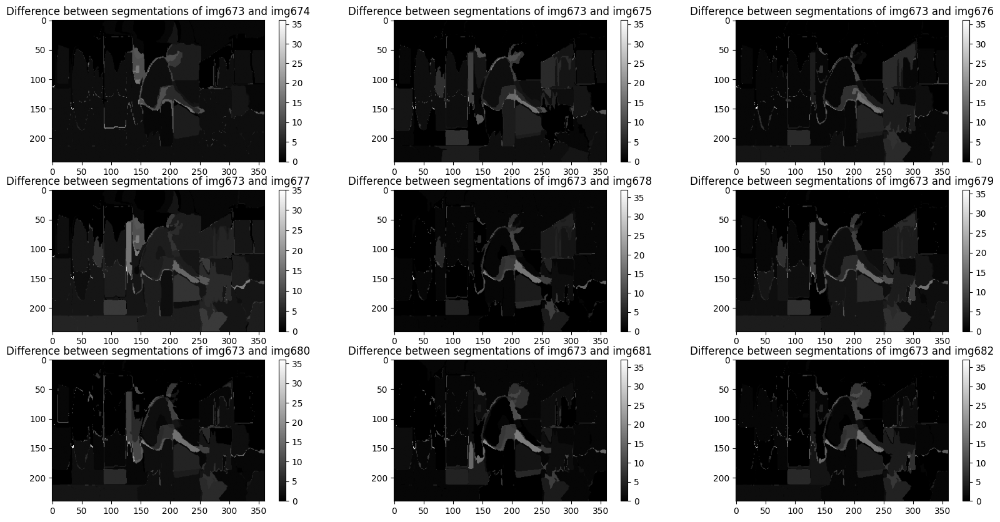

In [24]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img682')

Text(0.5, 1.0, 'Difference between segmentations of img681 and img682')

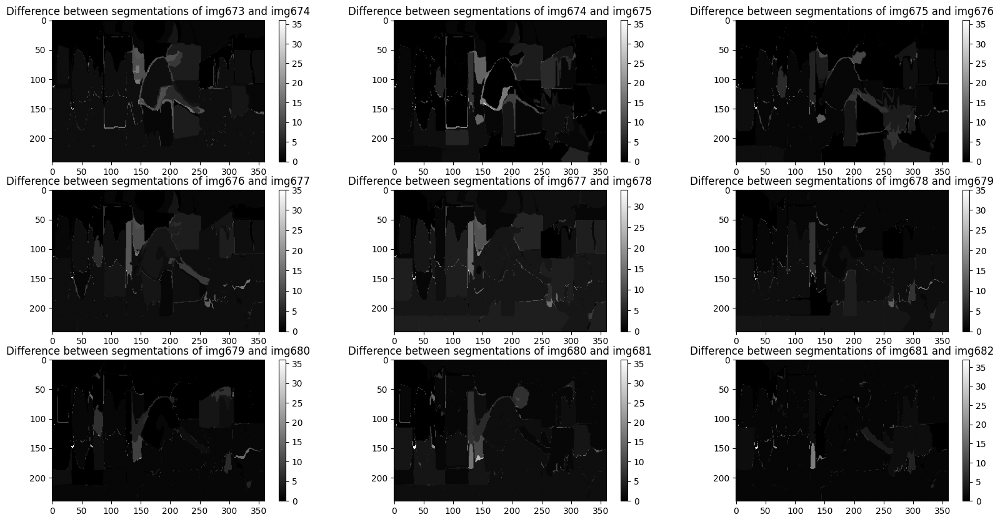

In [25]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_674_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img674 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_675_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img675 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_676_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img676 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_677_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img677 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_678_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img678 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_679_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img679 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_680_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img680 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_681_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img681 and img682')

In these frames we can see that the main movement is the one done by the arm. This is clearer in the previous visualization, with the difference between the first frame of the sequence and all the others.

### A step further: similarity between superpixels
Untile now, we've worked with the difference between pixels, not thinking much about how the superpixels are involved as a structure and not as labels. I implemented a new function that computes the difference between the superpixels (here called patches).

In [26]:
patches_673, centroids_673 = superpixels_patches(slic_673)
patches_674, centroids_674 = superpixels_patches(slic_674)
patches_675, centroids_675 = superpixels_patches(slic_675)
patches_676, centroids_676 = superpixels_patches(slic_676)
patches_677, centroids_677 = superpixels_patches(slic_677)
patches_678, centroids_678 = superpixels_patches(slic_678)
patches_679, centroids_679 = superpixels_patches(slic_679)
patches_680, centroids_680 = superpixels_patches(slic_680)
patches_681, centroids_681 = superpixels_patches(slic_681)
patches_682, centroids_682 = superpixels_patches(slic_682)

patches_673 = patch_descriptor(cv2.cvtColor(img_673, cv2.COLOR_BGR2GRAY), centroids_673, 5)
patches_674 = patch_descriptor(cv2.cvtColor(img_674, cv2.COLOR_BGR2GRAY), centroids_674, 5)
patches_675 = patch_descriptor(cv2.cvtColor(img_675, cv2.COLOR_BGR2GRAY), centroids_675, 5)
patches_676 = patch_descriptor(cv2.cvtColor(img_676, cv2.COLOR_BGR2GRAY), centroids_676, 5)
patches_677 = patch_descriptor(cv2.cvtColor(img_677, cv2.COLOR_BGR2GRAY), centroids_677, 5)
patches_678 = patch_descriptor(cv2.cvtColor(img_678, cv2.COLOR_BGR2GRAY), centroids_678, 5)
patches_679 = patch_descriptor(cv2.cvtColor(img_679, cv2.COLOR_BGR2GRAY), centroids_679, 5)
patches_680 = patch_descriptor(cv2.cvtColor(img_680, cv2.COLOR_BGR2GRAY), centroids_680, 5)
patches_681 = patch_descriptor(cv2.cvtColor(img_681, cv2.COLOR_BGR2GRAY), centroids_681, 5)
patches_682 = patch_descriptor(cv2.cvtColor(img_682, cv2.COLOR_BGR2GRAY), centroids_682, 5)

In [27]:
t = 0.3 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

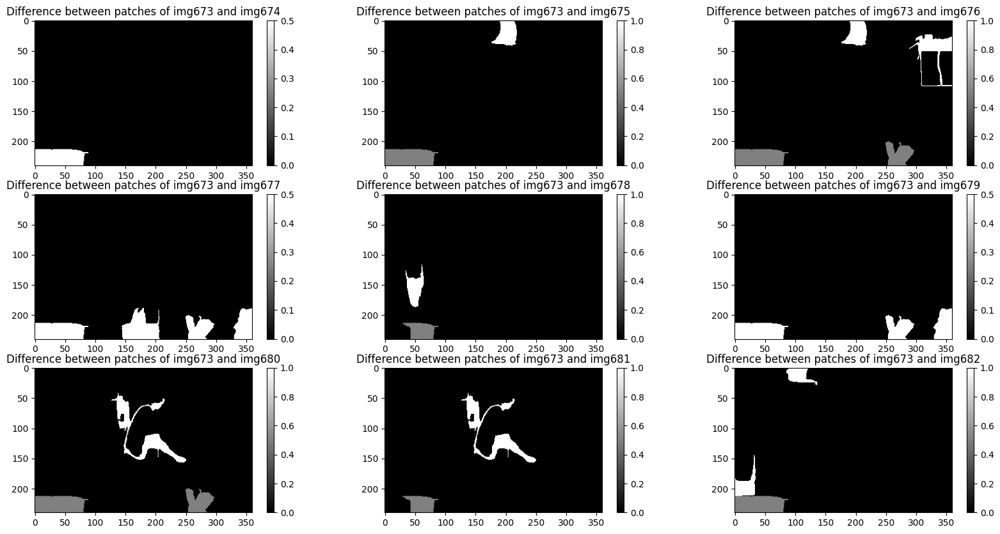

In [28]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

In these visualizations we can see in white what changed between the frames, in black what remained the same and in grey what was not there before. This happens because, as seen before, the SLIC segmentation can return a different number of superpixels for frames that are similar. The frame 680 and 681 are the ones that, with this value of threshold, show better the parts that move.

We can now try this approach with the scenes seen before.

In [29]:
patches_584, centroids_584 = superpixels_patches(slic_584)
patches_585, centroids_585 = superpixels_patches(slic_585)
patches_586, centroids_586 = superpixels_patches(slic_586)
patches_587, centroids_587 = superpixels_patches(slic_587)
patches_588, centroids_588 = superpixels_patches(slic_588)
patches_589, centroids_589 = superpixels_patches(slic_589)
patches_590, centroids_590 = superpixels_patches(slic_590)
patches_591, centroids_591 = superpixels_patches(slic_591)
patches_592, centroids_592 = superpixels_patches(slic_592)
patches_593, centroids_593 = superpixels_patches(slic_593)

patches_584 = patch_descriptor(cv2.cvtColor(img584, cv2.COLOR_BGR2GRAY), centroids_584, 5)
patches_585 = patch_descriptor(cv2.cvtColor(img585, cv2.COLOR_BGR2GRAY), centroids_585, 5)
patches_586 = patch_descriptor(cv2.cvtColor(img586, cv2.COLOR_BGR2GRAY), centroids_586, 5)
patches_587 = patch_descriptor(cv2.cvtColor(img587, cv2.COLOR_BGR2GRAY), centroids_587, 5)
patches_588 = patch_descriptor(cv2.cvtColor(img588, cv2.COLOR_BGR2GRAY), centroids_588, 5)
patches_589 = patch_descriptor(cv2.cvtColor(img589, cv2.COLOR_BGR2GRAY), centroids_589, 5)
patches_590 = patch_descriptor(cv2.cvtColor(img590, cv2.COLOR_BGR2GRAY), centroids_590, 5)
patches_591 = patch_descriptor(cv2.cvtColor(img591, cv2.COLOR_BGR2GRAY), centroids_591, 5)
patches_592 = patch_descriptor(cv2.cvtColor(img592, cv2.COLOR_BGR2GRAY), centroids_592, 5)
patches_593 = patch_descriptor(cv2.cvtColor(img593, cv2.COLOR_BGR2GRAY), centroids_593, 5)

In [30]:
t = 0.3 # Define the threshold value

diff_584_585 = difference_patches(slic_584, slic_585, patches_584, patches_585, t)
diff_584_586 = difference_patches(slic_584, slic_586, patches_584, patches_586, t)
diff_584_587 = difference_patches(slic_584, slic_587, patches_584, patches_587, t)
diff_584_588 = difference_patches(slic_584, slic_588, patches_584, patches_588, t)
diff_584_589 = difference_patches(slic_584, slic_589, patches_584, patches_589, t)
diff_584_590 = difference_patches(slic_584, slic_590, patches_584, patches_590, t)
diff_584_591 = difference_patches(slic_584, slic_591, patches_584, patches_591, t)
diff_584_592 = difference_patches(slic_584, slic_592, patches_584, patches_592, t)
diff_584_593 = difference_patches(slic_584, slic_593, patches_584, patches_593, t)

Text(0.5, 1.0, 'Difference between patches of img584 and img593')

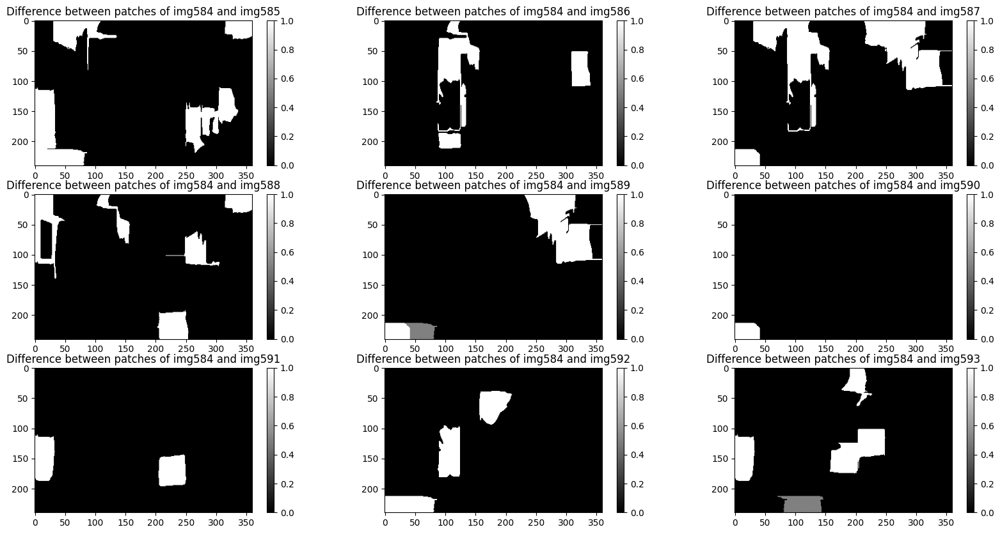

In [31]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_584_585, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img585')
plt.subplot(3, 3, 2)
plt.imshow(diff_584_586, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img586')
plt.subplot(3, 3, 3)
plt.imshow(diff_584_587, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img587')
plt.subplot(3, 3, 4)
plt.imshow(diff_584_588, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img588')
plt.subplot(3, 3, 5)
plt.imshow(diff_584_589, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img589')
plt.subplot(3, 3, 6)
plt.imshow(diff_584_590, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img590')
plt.subplot(3, 3, 7)
plt.imshow(diff_584_591, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img591')
plt.subplot(3, 3, 8)
plt.imshow(diff_584_592, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img592')
plt.subplot(3, 3, 9)
plt.imshow(diff_584_593, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img584 and img593')

In this case, the segmentation is really noisy, and this approach does not work well.

### Playing with the values: changing the parameters
Defining and using the functions, we could see how we have some arbitrary parameters that we can change. These are the number of segments, the compactness, the sigma, the size of the window for the patch descriptors and the threshold for the difference map (at the moment we are not focusing on alpha and sigma for the spectral matching since it's not used for our change detection). We take the last set of frames as reference and change the values to see if we can improve our results.

In [32]:
n_segments = 100

slic_673 = slic(img_673, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_674 = slic(img_674, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_675 = slic(img_675, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_676 = slic(img_676, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_677 = slic(img_677, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_678 = slic(img_678, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_679 = slic(img_679, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_680 = slic(img_680, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_681 = slic(img_681, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_682 = slic(img_682, n_segments=n_segments, compactness=compactness, sigma=sigma)

# Differences between the frame 673 and all the others
d_673_674 = difference(slic_673, slic_674)
d_673_675 = difference(slic_673, slic_675)
d_673_676 = difference(slic_673, slic_676)
d_673_677 = difference(slic_673, slic_677)
d_673_678 = difference(slic_673, slic_678)
d_673_679 = difference(slic_673, slic_679)
d_673_680 = difference(slic_673, slic_680)
d_673_681 = difference(slic_673, slic_681)
d_673_682 = difference(slic_673, slic_682)

Text(0.5, 1.0, 'Difference between segmentations of img673 and img682')

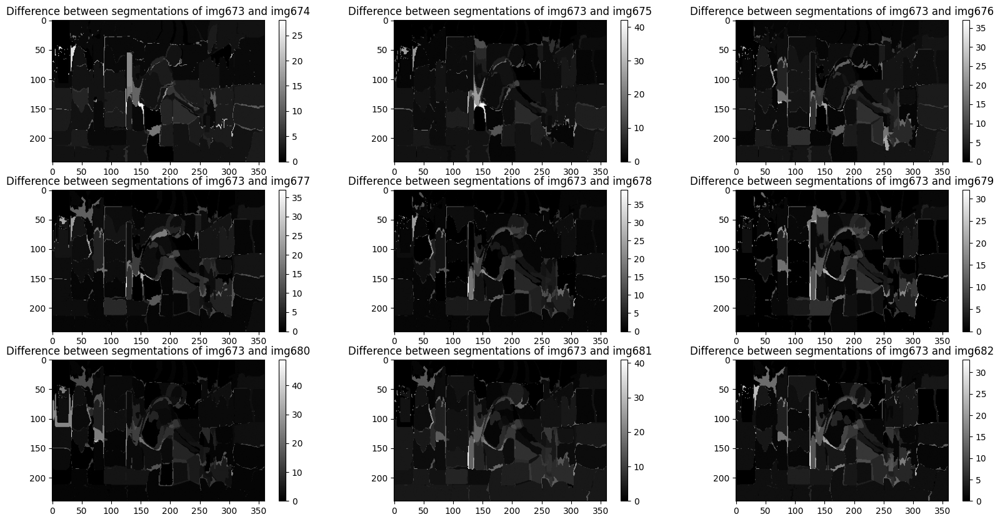

In [33]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img682')

Text(0.5, 1.0, 'Difference between segmentations of img681 and img682')

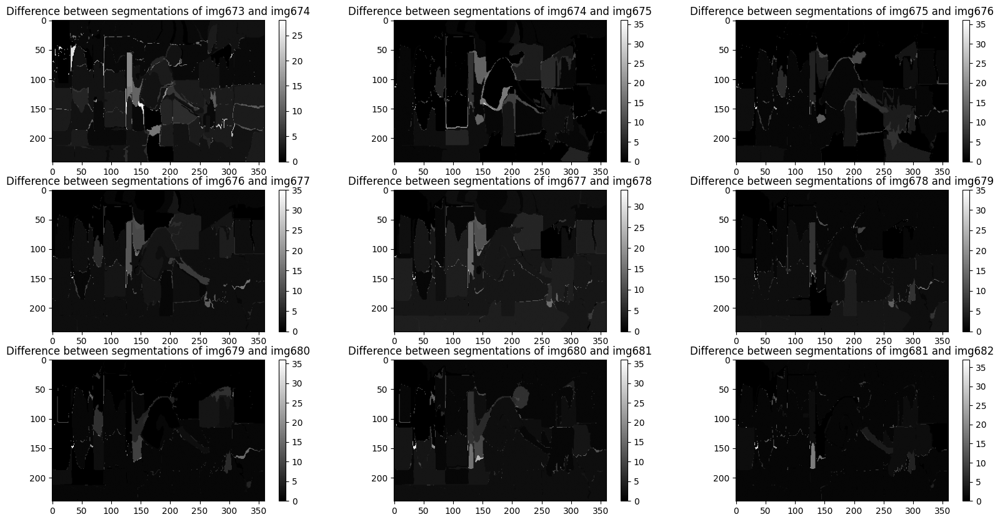

In [34]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_674_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img674 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_675_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img675 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_676_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img676 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_677_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img677 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_678_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img678 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_679_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img679 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_680_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img680 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_681_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img681 and img682')

With a bigger number of segments, the image is more noisy, but the movement is very well highlighted. We have a better result also with the visualization of the difference between subsequent frames.

In [35]:
patches_673, centroids_673 = superpixels_patches(slic_673)
patches_674, centroids_674 = superpixels_patches(slic_674)
patches_675, centroids_675 = superpixels_patches(slic_675)
patches_676, centroids_676 = superpixels_patches(slic_676)
patches_677, centroids_677 = superpixels_patches(slic_677)
patches_678, centroids_678 = superpixels_patches(slic_678)
patches_679, centroids_679 = superpixels_patches(slic_679)
patches_680, centroids_680 = superpixels_patches(slic_680)
patches_681, centroids_681 = superpixels_patches(slic_681)
patches_682, centroids_682 = superpixels_patches(slic_682)

patches_673 = patch_descriptor(cv2.cvtColor(img_673, cv2.COLOR_BGR2GRAY), centroids_673, 5)
patches_674 = patch_descriptor(cv2.cvtColor(img_674, cv2.COLOR_BGR2GRAY), centroids_674, 5)
patches_675 = patch_descriptor(cv2.cvtColor(img_675, cv2.COLOR_BGR2GRAY), centroids_675, 5)
patches_676 = patch_descriptor(cv2.cvtColor(img_676, cv2.COLOR_BGR2GRAY), centroids_676, 5)
patches_677 = patch_descriptor(cv2.cvtColor(img_677, cv2.COLOR_BGR2GRAY), centroids_677, 5)
patches_678 = patch_descriptor(cv2.cvtColor(img_678, cv2.COLOR_BGR2GRAY), centroids_678, 5)
patches_679 = patch_descriptor(cv2.cvtColor(img_679, cv2.COLOR_BGR2GRAY), centroids_679, 5)
patches_680 = patch_descriptor(cv2.cvtColor(img_680, cv2.COLOR_BGR2GRAY), centroids_680, 5)
patches_681 = patch_descriptor(cv2.cvtColor(img_681, cv2.COLOR_BGR2GRAY), centroids_681, 5)
patches_682 = patch_descriptor(cv2.cvtColor(img_682, cv2.COLOR_BGR2GRAY), centroids_682, 5)

t = 0.8 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

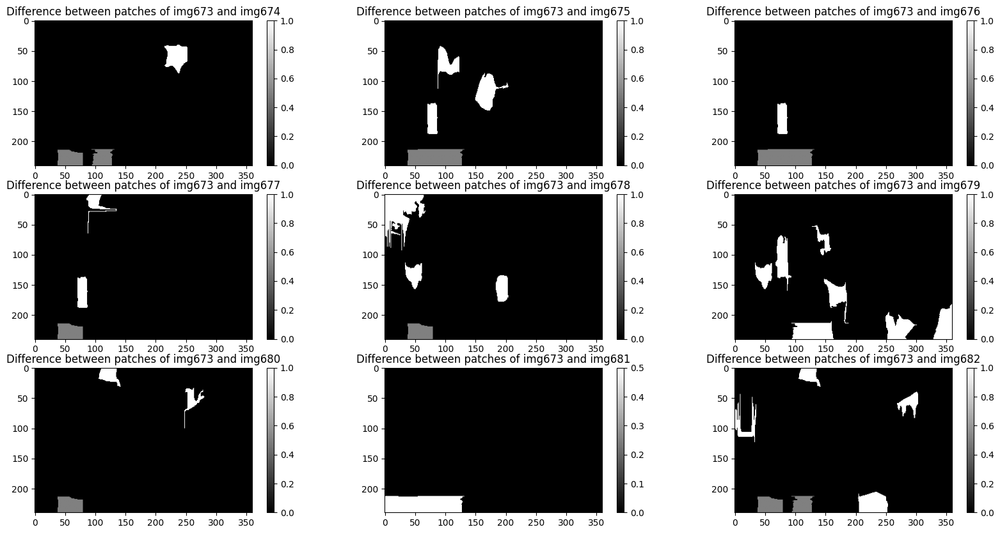

In [36]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

Even if the pixel-wise work has improved, the difference between the patches has not: as we increase the number of segments, meaning the number of superpixels, we are approaching the situation where we analyze singular pixels, which have less variability. What if we now reduce the number of segments?

In [37]:
n_segments = 20

slic_673 = slic(img_673, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_674 = slic(img_674, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_675 = slic(img_675, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_676 = slic(img_676, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_677 = slic(img_677, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_678 = slic(img_678, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_679 = slic(img_679, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_680 = slic(img_680, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_681 = slic(img_681, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_682 = slic(img_682, n_segments=n_segments, compactness=compactness, sigma=sigma)

# Differences between the frame 673 and all the others
d_673_674 = difference(slic_673, slic_674)
d_673_675 = difference(slic_673, slic_675)
d_673_676 = difference(slic_673, slic_676)
d_673_677 = difference(slic_673, slic_677)
d_673_678 = difference(slic_673, slic_678)
d_673_679 = difference(slic_673, slic_679)
d_673_680 = difference(slic_673, slic_680)
d_673_681 = difference(slic_673, slic_681)
d_673_682 = difference(slic_673, slic_682)

Text(0.5, 1.0, 'Difference between segmentations of img673 and img682')

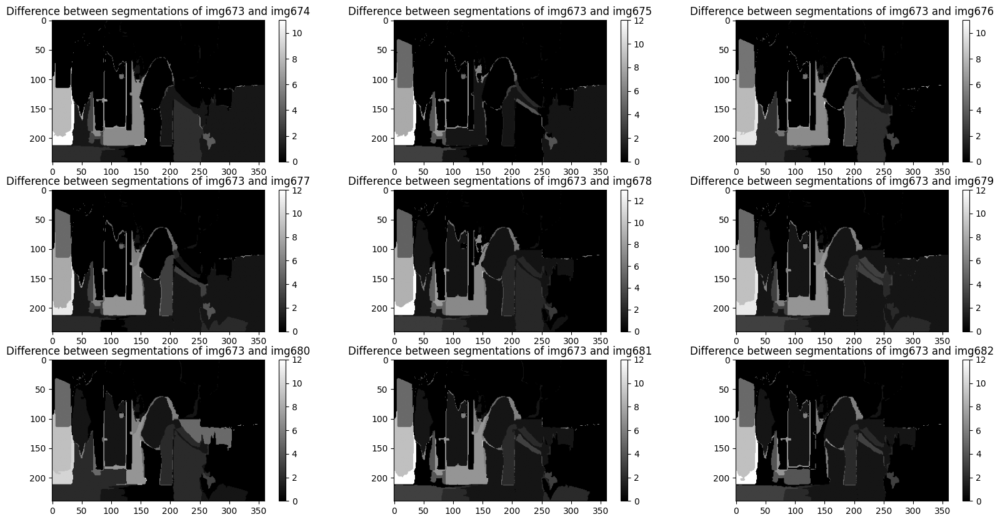

In [38]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img682')

Here we can see how the change is detected, but the higher differences seem to be on the left where, apparently, there is no movement.

Text(0.5, 1.0, 'Difference between segmentations of img681 and img682')

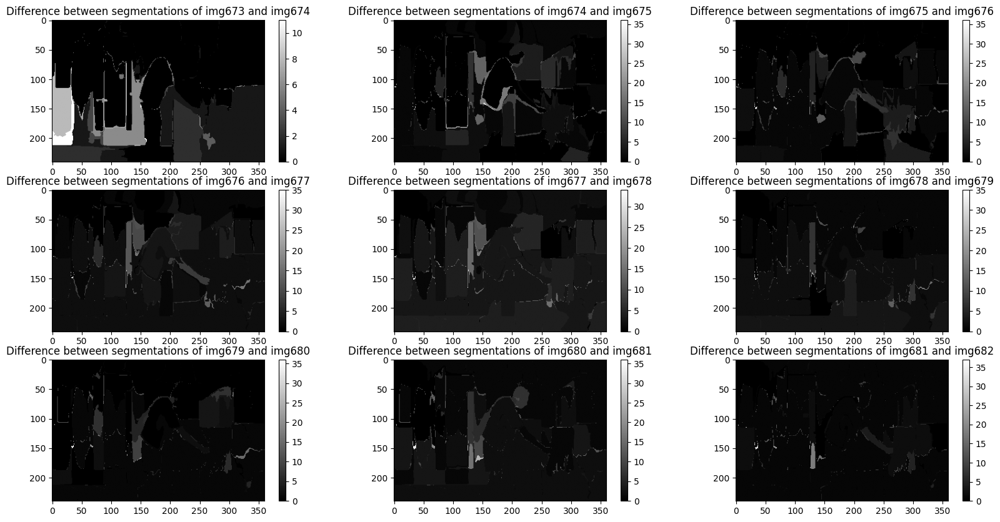

In [39]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(d_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(d_674_675, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img674 and img675')
plt.subplot(3, 3, 3)
plt.imshow(d_675_676, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img675 and img676')
plt.subplot(3, 3, 4)
plt.imshow(d_676_677, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img676 and img677')
plt.subplot(3, 3, 5)
plt.imshow(d_677_678, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img677 and img678')
plt.subplot(3, 3, 6)
plt.imshow(d_678_679, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img678 and img679')
plt.subplot(3, 3, 7)
plt.imshow(d_679_680, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img679 and img680')
plt.subplot(3, 3, 8)
plt.imshow(d_680_681, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img680 and img681')
plt.subplot(3, 3, 9)
plt.imshow(d_681_682, cmap='gray')
plt.colorbar()
plt.title('Difference between segmentations of img681 and img682')

In [40]:
patches_673, centroids_673 = superpixels_patches(slic_673)
patches_674, centroids_674 = superpixels_patches(slic_674)
patches_675, centroids_675 = superpixels_patches(slic_675)
patches_676, centroids_676 = superpixels_patches(slic_676)
patches_677, centroids_677 = superpixels_patches(slic_677)
patches_678, centroids_678 = superpixels_patches(slic_678)
patches_679, centroids_679 = superpixels_patches(slic_679)
patches_680, centroids_680 = superpixels_patches(slic_680)
patches_681, centroids_681 = superpixels_patches(slic_681)
patches_682, centroids_682 = superpixels_patches(slic_682)

patches_673 = patch_descriptor(cv2.cvtColor(img_673, cv2.COLOR_BGR2GRAY), centroids_673, 5)
patches_674 = patch_descriptor(cv2.cvtColor(img_674, cv2.COLOR_BGR2GRAY), centroids_674, 5)
patches_675 = patch_descriptor(cv2.cvtColor(img_675, cv2.COLOR_BGR2GRAY), centroids_675, 5)
patches_676 = patch_descriptor(cv2.cvtColor(img_676, cv2.COLOR_BGR2GRAY), centroids_676, 5)
patches_677 = patch_descriptor(cv2.cvtColor(img_677, cv2.COLOR_BGR2GRAY), centroids_677, 5)
patches_678 = patch_descriptor(cv2.cvtColor(img_678, cv2.COLOR_BGR2GRAY), centroids_678, 5)
patches_679 = patch_descriptor(cv2.cvtColor(img_679, cv2.COLOR_BGR2GRAY), centroids_679, 5)
patches_680 = patch_descriptor(cv2.cvtColor(img_680, cv2.COLOR_BGR2GRAY), centroids_680, 5)
patches_681 = patch_descriptor(cv2.cvtColor(img_681, cv2.COLOR_BGR2GRAY), centroids_681, 5)
patches_682 = patch_descriptor(cv2.cvtColor(img_682, cv2.COLOR_BGR2GRAY), centroids_682, 5)

t = 0.8 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

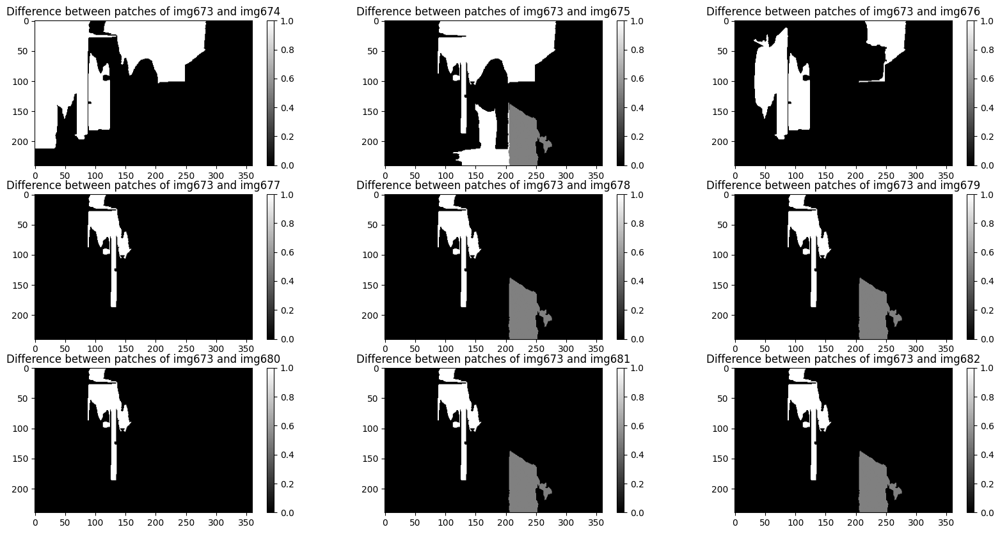

In [41]:
plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

This visualization unfortunately does not help us.

We can now use again n_segments=50 and try with different thresholds.

In [42]:
n_segments = 50

slic_673 = slic(img_673, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_674 = slic(img_674, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_675 = slic(img_675, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_676 = slic(img_676, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_677 = slic(img_677, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_678 = slic(img_678, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_679 = slic(img_679, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_680 = slic(img_680, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_681 = slic(img_681, n_segments=n_segments, compactness=compactness, sigma=sigma)
slic_682 = slic(img_682, n_segments=n_segments, compactness=compactness, sigma=sigma)

patches_673, centroids_673 = superpixels_patches(slic_673)
patches_674, centroids_674 = superpixels_patches(slic_674)
patches_675, centroids_675 = superpixels_patches(slic_675)
patches_676, centroids_676 = superpixels_patches(slic_676)
patches_677, centroids_677 = superpixels_patches(slic_677)
patches_678, centroids_678 = superpixels_patches(slic_678)
patches_679, centroids_679 = superpixels_patches(slic_679)
patches_680, centroids_680 = superpixels_patches(slic_680)
patches_681, centroids_681 = superpixels_patches(slic_681)
patches_682, centroids_682 = superpixels_patches(slic_682)

patches_673 = patch_descriptor(cv2.cvtColor(img_673, cv2.COLOR_BGR2GRAY), centroids_673, 5)
patches_674 = patch_descriptor(cv2.cvtColor(img_674, cv2.COLOR_BGR2GRAY), centroids_674, 5)
patches_675 = patch_descriptor(cv2.cvtColor(img_675, cv2.COLOR_BGR2GRAY), centroids_675, 5)
patches_676 = patch_descriptor(cv2.cvtColor(img_676, cv2.COLOR_BGR2GRAY), centroids_676, 5)
patches_677 = patch_descriptor(cv2.cvtColor(img_677, cv2.COLOR_BGR2GRAY), centroids_677, 5)
patches_678 = patch_descriptor(cv2.cvtColor(img_678, cv2.COLOR_BGR2GRAY), centroids_678, 5)
patches_679 = patch_descriptor(cv2.cvtColor(img_679, cv2.COLOR_BGR2GRAY), centroids_679, 5)
patches_680 = patch_descriptor(cv2.cvtColor(img_680, cv2.COLOR_BGR2GRAY), centroids_680, 5)
patches_681 = patch_descriptor(cv2.cvtColor(img_681, cv2.COLOR_BGR2GRAY), centroids_681, 5)
patches_682 = patch_descriptor(cv2.cvtColor(img_682, cv2.COLOR_BGR2GRAY), centroids_682, 5)

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

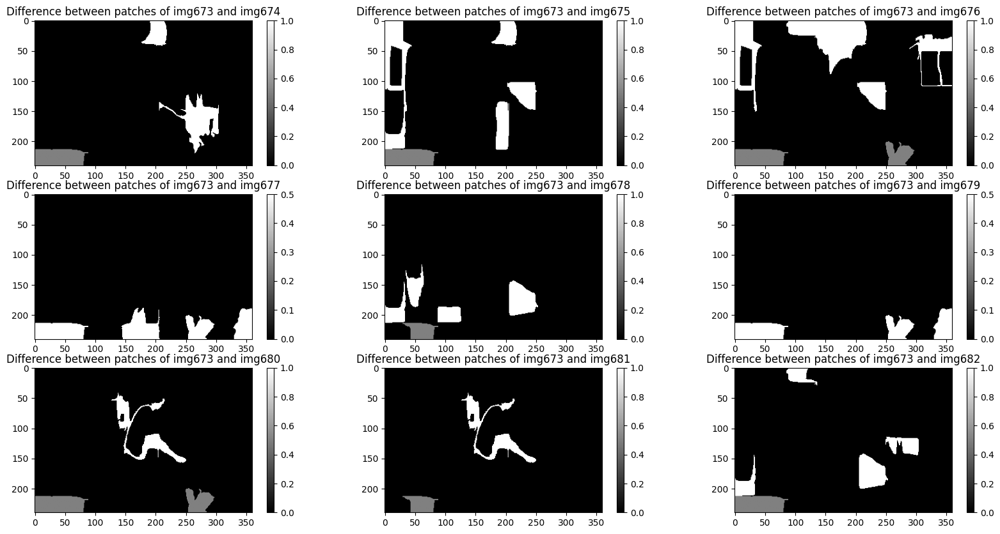

In [43]:
t = 0.8 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

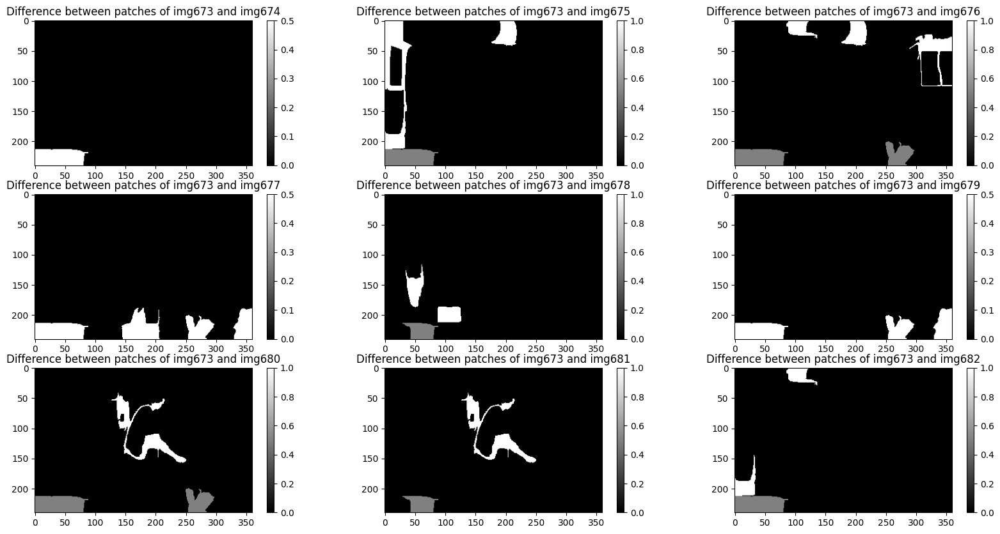

In [44]:
t = 0.5 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

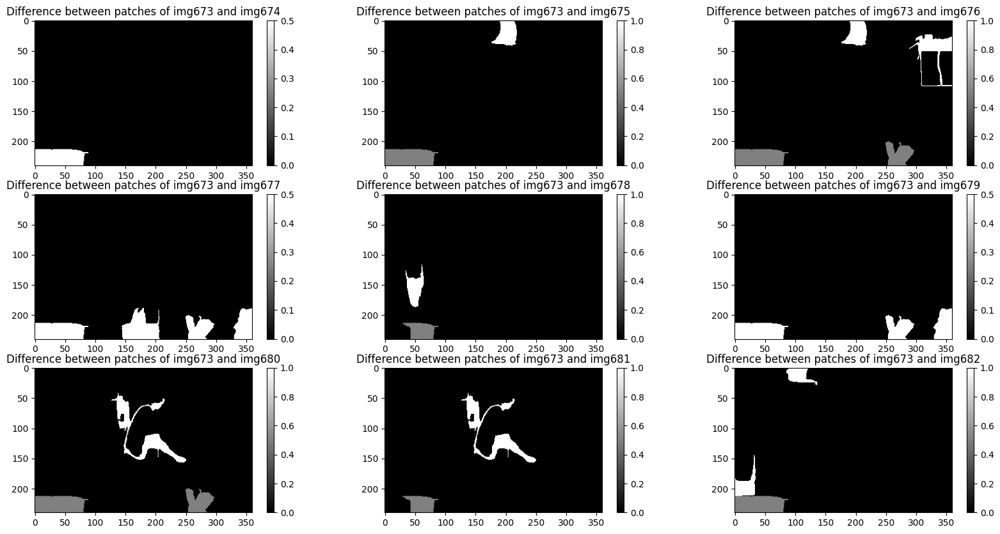

In [45]:
t = 0.3 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

Text(0.5, 1.0, 'Difference between patches of img673 and img682')

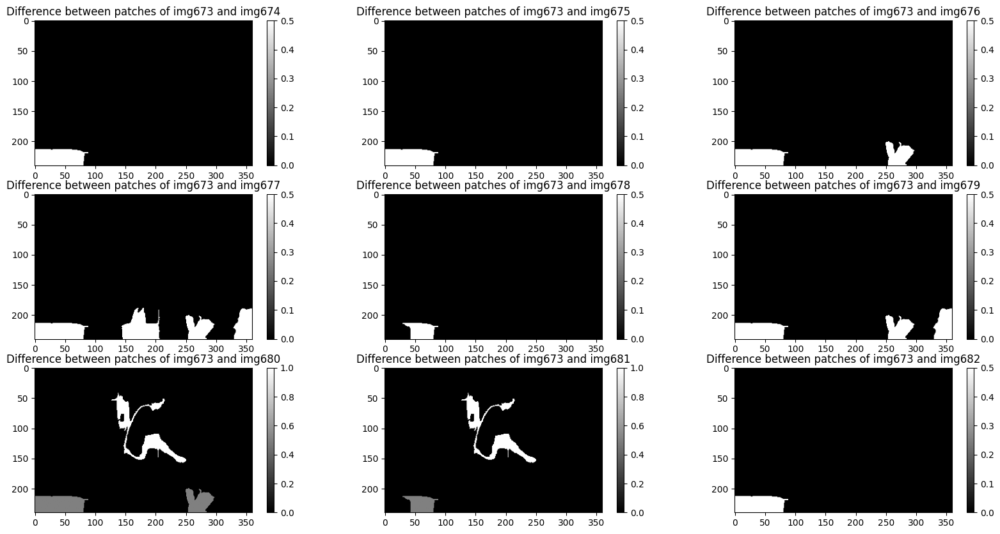

In [46]:
t = 0.1 # Define the threshold value

diff_673_674 = difference_patches(slic_673, slic_674, patches_673, patches_674, t)
diff_673_675 = difference_patches(slic_673, slic_675, patches_673, patches_675, t)
diff_673_676 = difference_patches(slic_673, slic_676, patches_673, patches_676, t)
diff_673_677 = difference_patches(slic_673, slic_677, patches_673, patches_677, t)
diff_673_678 = difference_patches(slic_673, slic_678, patches_673, patches_678, t)
diff_673_679 = difference_patches(slic_673, slic_679, patches_673, patches_679, t)
diff_673_680 = difference_patches(slic_673, slic_680, patches_673, patches_680, t)
diff_673_681 = difference_patches(slic_673, slic_681, patches_673, patches_681, t)
diff_673_682 = difference_patches(slic_673, slic_682, patches_673, patches_682, t)

plt.figure(figsize=(20, 10))
plt.subplot(3, 3, 1)
plt.imshow(diff_673_674, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img674')
plt.subplot(3, 3, 2)
plt.imshow(diff_673_675, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img675')
plt.subplot(3, 3, 3)
plt.imshow(diff_673_676, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img676')
plt.subplot(3, 3, 4)
plt.imshow(diff_673_677, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img677')
plt.subplot(3, 3, 5)
plt.imshow(diff_673_678, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img678')
plt.subplot(3, 3, 6)
plt.imshow(diff_673_679, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img679')
plt.subplot(3, 3, 7)
plt.imshow(diff_673_680, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img680')
plt.subplot(3, 3, 8)
plt.imshow(diff_673_681, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img681')
plt.subplot(3, 3, 9)
plt.imshow(diff_673_682, cmap='gray')
plt.colorbar()
plt.title('Difference between patches of img673 and img682')

Using a low threshold, the parts that remain highlighted are less: as seen before, in frames 673 and 680 we can see well the main movement of the scene. These parts are highlighted even with a high threshold.

### Conclusions
Superpixels segmentation can be used for change detection but it has some limits. 
- The most important one, as a result of my work, is that the labeling of the superpixels is not spatially order: this results in finding the presence of changes when, in reality, there may be only a different label for the same superpixel. 
- About the same algorithm, we have to remember that we may have a change in the number of superpixels between frames. 
- Another consideration is that we have a lot of parameters that have to be tuned together in order to find the best solution, which we consider the one that better detects changes: this is computationally more intensive than other methods.
- Some changes may also not be detected because minimal: in consecutive frames, we may have changes happening but they fall under the same superpixel. 

I have to consider that all the frames used are not filtered before or after working on them: this may be a possibility to work on in the future in order to find a better solution.